In [36]:
import os
import glob
from PIL import Image
import pandas as pd
from IPython.display import display, HTML

def analyze_images(folder_path):
    """
    Анализирует все изображения в указанной папке и возвращает DataFrame с информацией.
    :param folder_path: Путь к папке с изображениями.
    :return: DataFrame с информацией об изображениях.
    """
    data = []
    for file in glob.glob(os.path.join(folder_path, "*")):
        try:
            # Попробуем открыть файл как изображение
            with Image.open(file) as img:
                # Сбор информации
                file_info = {
                    "Имя файла": os.path.basename(file),
                    "Цветовая модель": img.mode,
                    "Формат": img.format,
                    "Количество каналов": len(img.getbands()),
                    "Размер файла (МБ)": round(os.path.getsize(file) / (1024 * 1024), 2),
                    "Ширина": img.width,
                    "Высота": img.height,
                    "Полный путь": os.path.abspath(file),
                }
                data.append(file_info)
        except Exception:
            # Если файл не является изображением, пропускаем его
            continue
    
    # Создаем DataFrame
    df = pd.DataFrame(data)
    return df

def display_images_with_thumbnails(df):
    """
    Отображает DataFrame с миниатюрами изображений.
    :param df: DataFrame с информацией об изображениях.
    """
    # Создание HTML-таблицы
    html = "<table border='1' style='border-collapse: collapse;'>"
    html += "<tr><th>Имя файла</th><th>Цветовая модель</th><th>Формат</th><th>Количество каналов</th><th>Размер файла (МБ)</th><th>Ширина</th><th>Высота</th><th>Полный путь</th><th>Изображение</th></tr>"
    
    for _, row in df.iterrows():
        html += "<tr>"
        html += f"<td>{row['Имя файла']}</td>"
        html += f"<td>{row['Цветовая модель']}</td>"
        html += f"<td>{row['Формат']}</td>"
        html += f"<td>{row['Количество каналов']}</td>"
        html += f"<td>{row['Размер файла (МБ)']}</td>"
        html += f"<td>{row['Ширина']}</td>"
        html += f"<td>{row['Высота']}</td>"
        html += f"<td>{row['Полный путь']}</td>"
        html += f"<td><img src='{row['Полный путь']}' width='150'></td>"
        html += "</tr>"
    
    html += "</table>"
    display(HTML(html))

# путь к папке с изображениями
folder_path = r"C:\PY\lab4"

# Анализируем изображения
result_df = analyze_images(folder_path)

# Отображаем DataFrame с миниатюрами
display_images_with_thumbnails(result_df)


Имя файла,Цветовая модель,Формат,Количество каналов,Размер файла (МБ),Ширина,Высота,Полный путь,Изображение
1.jpg,RGB,JPEG,3,0.01,227,222,C:\PY\lab4\1.jpg,
10.jpg,RGB,JPEG,3,0.01,259,194,C:\PY\lab4\10.jpg,
11.jpg,RGB,JPEG,3,0.11,1024,768,C:\PY\lab4\11.jpg,
12.jpg,RGB,JPEG,3,0.2,1023,819,C:\PY\lab4\12.jpg,
13.jpg,RGB,JPEG,3,5.99,3197,2477,C:\PY\lab4\13.jpg,
14.jpg,RGB,JPEG,3,0.07,700,450,C:\PY\lab4\14.jpg,
15.png,RGBA,PNG,4,0.89,751,675,C:\PY\lab4\15.png,
2.jpg,RGB,JPEG,3,0.01,275,183,C:\PY\lab4\2.jpg,
3.jpg,RGB,JPEG,3,0.01,300,168,C:\PY\lab4\3.jpg,
4.jpg,RGB,JPEG,3,0.12,1200,675,C:\PY\lab4\4.jpg,


Постер сохранен как C:\PY\lab4\poster1.jpg


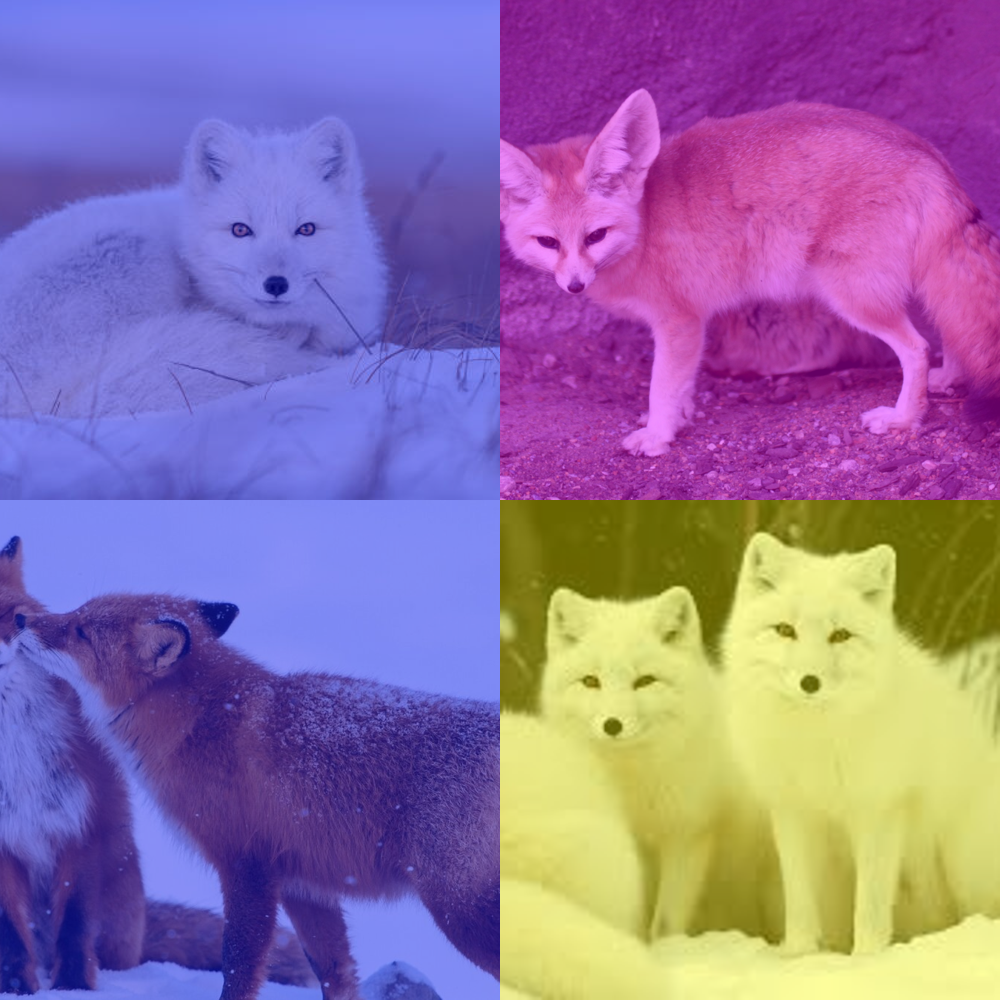

Постер сохранен как C:\PY\lab4\poster2.jpg


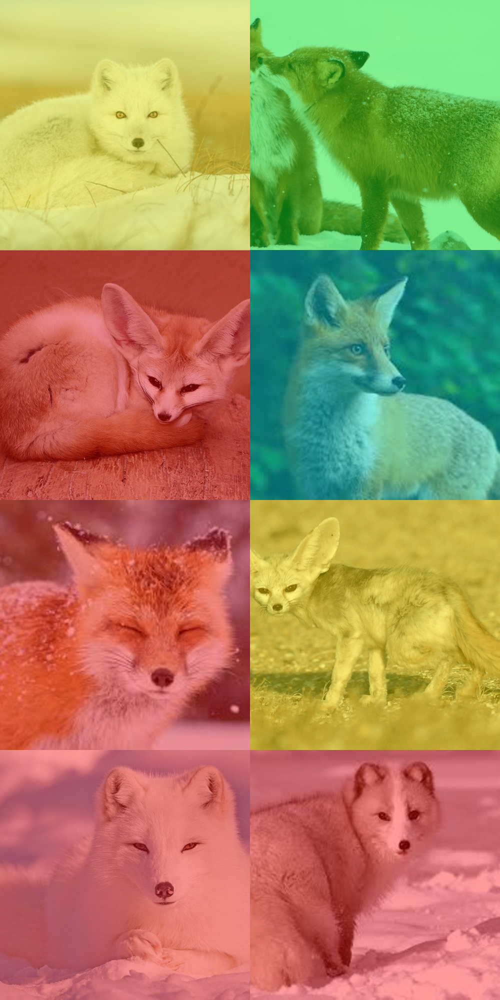

Постер сохранен как C:\PY\lab4\poster3.jpg


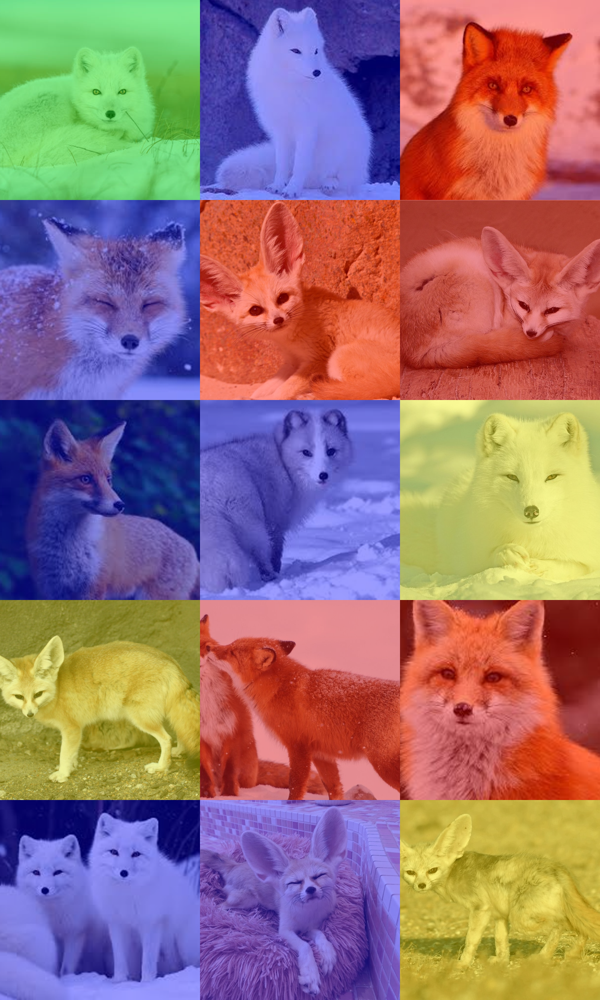

In [1]:
import os
import glob
import random
from PIL import Image
from IPython.display import display

def crop_to_square(img):
    """
    Обрезает изображение до квадрата с максимальной стороной, основанной на минимальном размере ширины и высоты.
    Центрирует квадратное изображение.
    """
    width, height = img.size
    min_side = min(width, height)
    left = (width - min_side) // 2
    top = (height - min_side) // 2
    right = left + min_side
    bottom = top + min_side
    return img.crop((left, top, right, bottom))

def apply_random_filter(img):
    """
    Применяет случайный цветной фильтр к изображению.
    """
    filters = [
        Image.new('RGBA', img.size, (255, 0, 0, 100)),  # Красный
        Image.new('RGBA', img.size, (0, 255, 0, 100)),  # Зеленый
        Image.new('RGBA', img.size, (0, 0, 255, 100)),  # Синий
        Image.new('RGBA', img.size, (255, 255, 0, 100)),  # Желтый
        Image.new('RGBA', img.size, (255, 0, 255, 100)),  # Пурпурный
        Image.new('RGBA', img.size, (0, 255, 255, 100)),  # Голубой
    ]
    filter_layer = random.choice(filters)
    return Image.alpha_composite(img.convert("RGBA"), filter_layer).convert("RGB")

def create_poster(folder_path, output_image_name, rows, cols, image_size=500, image_files=None):
    """
    Создает постер из изображений указанной папки.
    :param folder_path: Путь к папке с изображениями.
    :param output_image_name: Имя выходного файла постера.
    :param rows: Количество рядов изображений.
    :param cols: Количество столбцов изображений.
    :param image_size: Размер стороны квадрата изображения после изменения.
    :param image_files: Список доступных изображений для постера.
    :return: Постер в виде изображения (объект PIL.Image).
    """
    if image_files is None:
        # Список всех изображений в папке с проверкой расширения
        valid_extensions = {".jpg", ".jpeg", ".png", ".bmp", ".tiff", ".gif"}
        image_files = [
            f for f in glob.glob(os.path.join(folder_path, "*"))
            if os.path.splitext(f)[1].lower() in valid_extensions
        ]
    
    # Ограничиваем количество изображений до 15
    if len(image_files) > 15:
        image_files = random.sample(image_files, 15)
    
    if not image_files:
        raise ValueError("В указанной папке нет изображений или их формат не поддерживается.")
    
    # Создаем пустой постер
    poster_width = cols * image_size
    poster_height = rows * image_size
    poster = Image.new("RGB", (poster_width, poster_height), "white")
    
    used_images = set()  # Множество для хранения использованных изображений

    for row in range(rows):
        for col in range(cols):
            if len(used_images) >= len(image_files):
                break  # Если все изображения использованы, выходим
            # Выбираем случайное изображение, которое еще не использовалось
            random_image_file = random.choice([img for img in image_files if img not in used_images])
            
            with Image.open(random_image_file) as img:
                # Преобразуем в квадрат
                img = crop_to_square(img)
                # Меняем размер
                img = img.resize((image_size, image_size))
                # Применяем случайный фильтр
                img = apply_random_filter(img)
                # Вставляем в постер
                x_offset = col * image_size
                y_offset = row * image_size
                poster.paste(img, (x_offset, y_offset))
                # Добавляем изображение в использованные
                used_images.add(random_image_file)
    
    # Сохраняем постер на диск
    output_path = os.path.join(folder_path, output_image_name)
    poster.save(output_path)
    print(f"Постер сохранен как {output_path}")
    return poster

# Параметры для постеров
folder_path = r"C:\PY\lab4"  # Папка с изображениями из задания 1
poster_params = [
    {"output_image_name": "poster1.jpg", "rows": 2, "cols": 2},  # 15 изображений
    {"output_image_name": "poster2.jpg", "rows": 4, "cols": 2},  # 15 изображений
    {"output_image_name": "poster3.jpg", "rows": 5, "cols": 3},  # 15 изображений
]

# Список изображений для использования (исключая постеры)
image_files = [
    f for f in glob.glob(os.path.join(folder_path, "*"))
    if os.path.splitext(f)[1].lower() in {".jpg", ".jpeg", ".png", ".bmp", ".tiff", ".gif"}
]

# Создаем и отображаем постеры
posters = []
for params in poster_params:
    poster = create_poster(
        folder_path=folder_path,
        output_image_name=params["output_image_name"],
        rows=params["rows"],
        cols=params["cols"],
        image_files=image_files  # Передаем список изображений
    )
    posters.append(poster)
    display(poster)
